In [45]:
%matplotlib inline

In [220]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import time
import datetime
import seaborn as sns

import statsmodels.stats.diagnostic as dg
import statsmodels.tools.tools as ct
import statsmodels.regression.linear_model as rg
from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm
# from pandas.tools.plotting import autocorrelation_plot
import xgboost as xgb
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [46]:
def parser(x):
    return datetime.datetime.strptime(x,'%Y-%m-%d')

In [47]:
START_DATE = "2018-02-07"
END_DATE = "2021-12-31"
SPLIT_FACTOR = 0.8

In [48]:
raw_data = pd.read_csv(r'data\dataset_4.csv', header=0, sep = ";", parse_dates=[0], date_parser=parser)
mask = (raw_data['Date'] > START_DATE) & (raw_data['Date'] <= END_DATE)
stock_df = raw_data.loc[mask]
stock_df.reset_index(inplace = True, drop = True)
stock_df

,Date,^GSPC,^DJI,^IXIC,^NYA,^VIX,EURUSD=X,JPY=X,GBPUSD=X,^IRX,...,MRK,LLY,MCD,T,NKE,DHR,LOW,LIN,TXN,NEE
0,2018-02-08,2581.000000,23860.46094,6777.160156,12270.65039,33.459999,1.226813,109.195999,1.387925,1.515,...,46.133179,68.364784,144.398575,27.331118,60.115166,90.481277,88.657265,134.166519,88.365807,33.178360
1,2018-02-09,2619.550049,24190.90039,6874.490234,12405.82031,29.059999,1.226076,108.528999,1.393495,1.525,...,46.251186,70.225677,146.060852,27.699932,63.001156,92.739372,90.672829,139.204605,90.926476,33.820045
2,2018-02-12,2656.000000,24601.26953,6981.959961,12560.12012,25.610001,1.225280,108.800003,1.382743,1.535,...,46.723221,70.244118,148.876709,27.945822,63.472538,93.672089,91.242043,143.181122,92.238495,34.253925
3,2018-02-13,2662.939941,24640.44922,7013.509766,12574.37012,24.969999,1.230376,108.690002,1.385233,1.570,...,46.276478,70.207275,147.514191,28.122543,63.366711,93.249924,89.637047,143.255600,91.369858,34.498264
4,2018-02-14,2698.629883,24893.49023,7143.620117,12746.71973,19.260000,1.235376,107.764000,1.388696,1.550,...,46.276478,71.490807,145.325119,27.976555,65.377281,94.349518,90.448891,144.410355,92.908058,34.272198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,4791.189941,36302.37891,15871.259770,17141.08984,17.680000,1.159152,113.253998,1.356451,0.043,...,76.570000,278.410004,268.239990,24.286488,167.580002,327.197418,252.866135,343.420013,191.839996,91.320000
978,2021-12-28,4786.350098,36398.21094,15781.719730,17134.16016,17.540001,1.159555,112.912003,1.356000,0.050,...,76.809998,276.429993,267.880005,24.325691,166.419998,323.230011,253.185089,343.790008,191.100006,91.879997
979,2021-12-29,4793.060059,36488.62891,15766.219730,17149.92969,16.950001,1.148594,113.904999,1.341274,0.045,...,76.949997,278.420013,268.489990,24.149275,168.779999,326.579987,256.723419,345.399994,190.809998,91.989998
980,2021-12-30,4778.729980,36398.07813,15741.559570,17164.24023,17.330000,1.145082,114.042999,1.336648,0.025,...,77.139999,277.250000,267.209992,24.286488,167.490005,328.470001,255.547317,344.329987,189.410004,92.769997


In [49]:
stock_df.dtypes

Date     datetime64[ns]
^GSPC           float64
^DJI            float64
^IXIC           float64
^NYA            float64
              ...      
DHR             float64
LOW             float64
LIN             float64
TXN             float64
NEE             float64
Length: 89, dtype: object

In [50]:
stock_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
^GSPC,982.0,3301.711352,640.582259,2237.399902,2802.767579,3021.760010,3768.414978,4793.060059
^DJI,982.0,28160.606923,3902.581096,18591.929690,25334.300290,26787.019535,30667.230470,36488.628910
^IXIC,982.0,10059.914873,2889.163580,6192.919922,7730.612427,8590.285156,12951.454835,16057.440430
^NYA,982.0,13611.313007,1752.234867,8777.379883,12560.750003,12965.729980,14743.814942,17310.509770
^VIX,982.0,20.417729,8.876471,10.850000,14.887500,17.995000,22.982500,82.690002
...,...,...,...,...,...,...,...,...
DHR,982.0,174.744299,70.692300,90.481277,107.955637,147.324593,225.278038,331.984619
LOW,982.0,132.086216,46.994736,63.062408,93.549803,110.198524,166.101482,260.520904
LIN,982.0,210.674539,57.897348,133.050629,156.725769,194.772316,250.756592,346.429993
TXN,982.0,130.047081,35.670936,81.057091,100.933439,117.396557,162.859924,200.057846


In [51]:
AMD = pd.read_csv(r'data\AMD.csv', header=0, parse_dates=[0], date_parser=parser)
mask = (AMD['Date_amd'] > START_DATE) & (AMD['Date_amd'] <= END_DATE)
stock_df_AMD = AMD.loc[mask]
stock_df_AMD.reset_index(inplace = True, drop = True)
stock_df_AMD

,Date_amd,High,Low,Open,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,2018-02-08,42.400002,41.340000,42.400002,41.349998,4495200.0,36.631897,36.938362,37.078644,37.011569,44.562755,0.279093,43.851404,39.898263
1,2018-02-09,41.820000,40.619999,41.759998,41.490002,5540600.0,36.755924,36.921776,36.893870,37.078222,45.624283,0.230660,43.801392,40.036608
2,2018-02-12,41.740002,40.369999,41.650002,41.270000,6433500.0,36.561028,36.888981,36.743267,37.108174,44.192266,0.174539,43.752762,40.151238
3,2018-02-13,41.419998,40.970001,41.099998,41.340000,2449900.0,36.623043,36.864805,36.731877,37.143610,44.786122,0.133527,43.724205,40.228462
4,2018-02-14,41.950001,40.720001,40.910000,41.820000,3644400.0,37.048271,36.881484,36.886277,37.187483,48.808567,0.133795,43.679449,40.353552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,66.089996,65.250000,65.540001,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
978,2021-12-28,66.980003,66.000000,66.000000,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
979,2021-12-29,67.459999,66.870003,67.050003,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
980,2021-12-30,67.410004,66.830002,67.199997,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [52]:
tsi_sp = pd.read_excel(r"data\tsi_sp.xls")
tsi_sp

,tsi_date,tsi_sp
0,2018-02-06,100.00
1,2018-02-07,99.50
2,2018-02-08,95.77
3,2018-02-09,97.19
4,2018-02-12,98.46
...,...,...
988,2022-01-07,187.81
989,2022-01-10,187.55
990,2022-01-11,189.26
991,2022-01-12,189.52


In [53]:
stock_df=stock_df.merge(tsi_sp, left_index=True,right_index=True)
stock_df = stock_df.drop(labels=['tsi_date'], axis=1)
stock_df

,Date,^GSPC,^DJI,^IXIC,^NYA,^VIX,EURUSD=X,JPY=X,GBPUSD=X,^IRX,...,LLY,MCD,T,NKE,DHR,LOW,LIN,TXN,NEE,tsi_sp
0,2018-02-08,2581.000000,23860.46094,6777.160156,12270.65039,33.459999,1.226813,109.195999,1.387925,1.515,...,68.364784,144.398575,27.331118,60.115166,90.481277,88.657265,134.166519,88.365807,33.178360,100.00
1,2018-02-09,2619.550049,24190.90039,6874.490234,12405.82031,29.059999,1.226076,108.528999,1.393495,1.525,...,70.225677,146.060852,27.699932,63.001156,92.739372,90.672829,139.204605,90.926476,33.820045,99.50
2,2018-02-12,2656.000000,24601.26953,6981.959961,12560.12012,25.610001,1.225280,108.800003,1.382743,1.535,...,70.244118,148.876709,27.945822,63.472538,93.672089,91.242043,143.181122,92.238495,34.253925,95.77
3,2018-02-13,2662.939941,24640.44922,7013.509766,12574.37012,24.969999,1.230376,108.690002,1.385233,1.570,...,70.207275,147.514191,28.122543,63.366711,93.249924,89.637047,143.255600,91.369858,34.498264,97.19
4,2018-02-14,2698.629883,24893.49023,7143.620117,12746.71973,19.260000,1.235376,107.764000,1.388696,1.550,...,71.490807,145.325119,27.976555,65.377281,94.349518,90.448891,144.410355,92.908058,34.272198,98.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,4791.189941,36302.37891,15871.259770,17141.08984,17.680000,1.159152,113.253998,1.356451,0.043,...,278.410004,268.239990,24.286488,167.580002,327.197418,252.866135,343.420013,191.839996,91.320000,189.80
978,2021-12-28,4786.350098,36398.21094,15781.719730,17134.16016,17.540001,1.159555,112.912003,1.356000,0.050,...,276.429993,267.880005,24.325691,166.419998,323.230011,253.185089,343.790008,191.100006,91.879997,190.72
979,2021-12-29,4793.060059,36488.62891,15766.219730,17149.92969,16.950001,1.148594,113.904999,1.341274,0.045,...,278.420013,268.489990,24.149275,168.779999,326.579987,256.723419,345.399994,190.809998,91.989998,192.89
980,2021-12-30,4778.729980,36398.07813,15741.559570,17164.24023,17.330000,1.145082,114.042999,1.336648,0.025,...,277.250000,267.209992,24.286488,167.490005,328.470001,255.547317,344.329987,189.410004,92.769997,192.77


In [54]:
stock_df = stock_df.merge(stock_df_AMD, left_index=True,right_index=True)
stock_df = stock_df.drop(labels=['Date_amd'], axis=1)
stock_df

,Date,^GSPC,^DJI,^IXIC,^NYA,^VIX,EURUSD=X,JPY=X,GBPUSD=X,^IRX,...,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,2018-02-08,2581.000000,23860.46094,6777.160156,12270.65039,33.459999,1.226813,109.195999,1.387925,1.515,...,41.349998,4495200.0,36.631897,36.938362,37.078644,37.011569,44.562755,0.279093,43.851404,39.898263
1,2018-02-09,2619.550049,24190.90039,6874.490234,12405.82031,29.059999,1.226076,108.528999,1.393495,1.525,...,41.490002,5540600.0,36.755924,36.921776,36.893870,37.078222,45.624283,0.230660,43.801392,40.036608
2,2018-02-12,2656.000000,24601.26953,6981.959961,12560.12012,25.610001,1.225280,108.800003,1.382743,1.535,...,41.270000,6433500.0,36.561028,36.888981,36.743267,37.108174,44.192266,0.174539,43.752762,40.151238
3,2018-02-13,2662.939941,24640.44922,7013.509766,12574.37012,24.969999,1.230376,108.690002,1.385233,1.570,...,41.340000,2449900.0,36.623043,36.864805,36.731877,37.143610,44.786122,0.133527,43.724205,40.228462
4,2018-02-14,2698.629883,24893.49023,7143.620117,12746.71973,19.260000,1.235376,107.764000,1.388696,1.550,...,41.820000,3644400.0,37.048271,36.881484,36.886277,37.187483,48.808567,0.133795,43.679449,40.353552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,4791.189941,36302.37891,15871.259770,17141.08984,17.680000,1.159152,113.253998,1.356451,0.043,...,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
978,2021-12-28,4786.350098,36398.21094,15781.719730,17134.16016,17.540001,1.159555,112.912003,1.356000,0.050,...,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
979,2021-12-29,4793.060059,36488.62891,15766.219730,17149.92969,16.950001,1.148594,113.904999,1.341274,0.045,...,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
980,2021-12-30,4778.729980,36398.07813,15741.559570,17164.24023,17.330000,1.145082,114.042999,1.336648,0.025,...,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [34]:
#https://github.com/borisbanushev/stockpredictionai/blob/master/readme2.md#corrassets

In [55]:
num_training_days = int(stock_df.shape[0]*SPLIT_FACTOR)
split_point = stock_df[num_training_days: num_training_days+1].values[0][0]
year = split_point.year
month = split_point.month
day = split_point.day
print(f"Number of training days: {num_training_days}. Number of test days: {stock_df.shape[0]-num_training_days}.")
print(f"Split date is: {split_point}. Index is: {stock_df[num_training_days: num_training_days+1].index.values[0]}")

Number of training days: 785. Number of test days: 197.
Split date is: 2021-03-24 00:00:00. Index is: 785


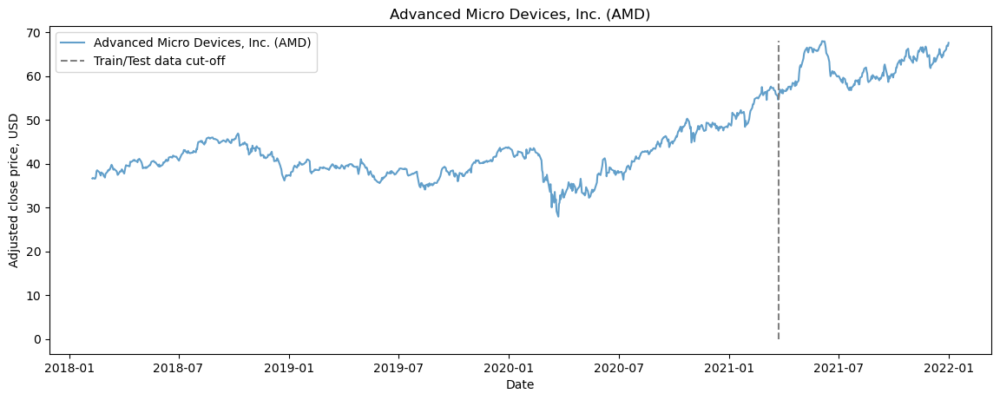

In [56]:
plt.figure(figsize=(14, 5), dpi=100)
plt.plot(stock_df['Date'], stock_df['Adj Close'], label='Advanced Micro Devices, Inc. (AMD)', alpha = 0.7)
plt.vlines(datetime.date(year,month, day), 0, stock_df['Adj Close'].max(), linestyles='--', colors='gray', label='Train/Test data cut-off')
plt.xlabel('Date')
plt.ylabel('Adjusted close price, USD')
plt.title('Advanced Micro Devices, Inc. (AMD)')
plt.legend()
plt.show()

In [57]:
stock_df.describe().T

,count,mean,std,min,25%,50%,75%,max
^GSPC,982.0,3301.711352,640.582259,2237.399902,2802.767579,3021.760010,3768.414978,4793.060059
^DJI,982.0,28160.606923,3902.581096,18591.929690,25334.300290,26787.019535,30667.230470,36488.628910
^IXIC,982.0,10059.914873,2889.163580,6192.919922,7730.612427,8590.285156,12951.454835,16057.440430
^NYA,982.0,13611.313007,1752.234867,8777.379883,12560.750003,12965.729980,14743.814942,17310.509770
^VIX,982.0,20.417729,8.876471,10.850000,14.887500,17.995000,22.982500,82.690002
...,...,...,...,...,...,...,...,...
ma_21,982.0,45.222854,9.278724,32.209557,38.521555,41.869273,49.013312,66.493861
rsi,982.0,53.682648,11.732055,17.612548,46.257675,54.147937,62.128288,81.868181
macd,982.0,0.200746,0.737441,-2.827388,-0.068369,0.217004,0.632947,2.376329
bolu,982.0,49.856421,8.645621,36.805991,43.523801,46.847801,52.703093,71.070118


In [58]:
corr = stock_df.corr()
corr.style.background_gradient(cmap='coolwarm')

In [59]:
def plot_technical_indicators(dataset, last_days):
    plt.figure(figsize=(16, 10), dpi=100)
    shape_0 = dataset.shape[0]
    xmacd_ = shape_0-last_days
    
    dataset = dataset.iloc[-last_days:, :]
    x_ = range(3, dataset.shape[0])
    x_ =list(dataset.index)
    
    # Plot first subplot
    plt.subplot(3, 1, 1)
    plt.plot(dataset['ma_7'],label='MA 7', color='g',linestyle='--')
    plt.plot(dataset['ma_21'],label='MA 21', color='r',linestyle='--')
    plt.plot(dataset['Adj Close'],label='Adj Close', color='b')
    plt.plot(dataset['bolu'],label='Bollinger Upper Band', color='c')
    plt.plot(dataset['bold'],label='Bollinger Lower Band', color='c')
    plt.fill_between(x_, dataset['bolu'], dataset['bold'], alpha=0.35)
    plt.title('Technical indicators for Advanced Micro Devices, Inc. (AMD) - last {} days.'.format(last_days))
    plt.ylabel('Adjusted close price, USD')
    plt.legend()

    # Plot second subplot
    plt.subplot(3, 1, 2)
    plt.title('MACD')
    plt.plot(dataset['macd'],label='MACD', linestyle='-.')
    plt.hlines(5, xmacd_, shape_0, colors='g', linestyles='--')
    plt.hlines(-5, xmacd_, shape_0, colors='g', linestyles='--')
    plt.legend()
    
    plt.subplot(3, 1, 3)
    plt.title('RSI')
    plt.plot(dataset['rsi'],label='RSI', color='b',linestyle='-')
    plt.legend()
    
    plt.show()

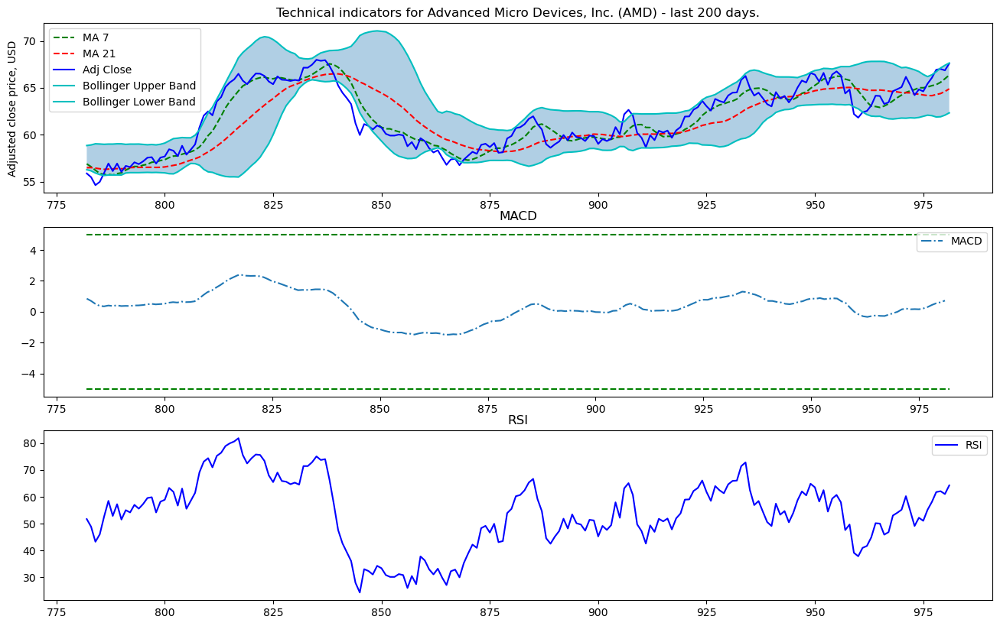

In [60]:
plot_technical_indicators(stock_df, 200)

In [61]:
def statistic(df, param):
    df = ct.add_constant(df)
    ivar = ["const"] + param
    reg = rg.OLS(df["Adj Close"], df[ivar], hasconst=bool).fit()
    res = reg.resid
    dw = durbin_watson(res)
    bplmt_statistic = np.round(dg.het_breuschpagan(res, exog_het = df[ivar])[0], 6)
    bplmt_p_value = np.round(dg.het_breuschpagan(res, exog_het = df[ivar])[1], 6)

    return bplmt_statistic, bplmt_p_value, dw, df[ivar]

In [62]:
parameters = []
for el in stock_df.columns.tolist():
    if el != "Adj Close" and el != 'Date':
        parameters.append([el])



In [63]:
#https://www.youtube.com/watch?v=jy2OurbLFGg
#https://stats.stackexchange.com/questions/239060/interpretation-of-breusch-pagan-test-bptest-in-r/239062
#https://www.statsmodels.org/dev/_modules/statsmodels/stats/diagnostic.html#het_breuschpagan
# https://www.statsmodels.org/stable/_modules/statsmodels/stats/stattools.html#durbin_watson
# https://www.statology.org/durbin-watson-test-python/
param =  (parameters)
pairplot_list = []

for el in param:   
    col_names = ["Adj Close"] + el
    data_for_test = stock_df[col_names]
    bp_statistic = statistic(data_for_test, el)[0]
    bp_pvalue = statistic(data_for_test, el)[1]
    dw = statistic(data_for_test, el)[2]
    if bp_pvalue>=0.05:# and (dw >= 1 and dw >= 3)
        pairplot_list.append(el[0])
        print("--------------------")
        print(f"Heteroskedastic analysis for {el}")
        print()
        print(f"Breusch-Pagan LM test statistic", statistic(data_for_test, el)[0])
        print("Breusch-Pagan LM test P-Value: ", statistic(data_for_test, el)[1])
        print("durbin_watson: ", statistic(data_for_test, el)[2]) 
        print()


--------------------
Heteroskedastic analysis for ['^IXIC']

Breusch-Pagan LM test statistic 3.677316
Breusch-Pagan LM test P-Value:  0.055158
durbin_watson:  0.02128277382880904

--------------------
Heteroskedastic analysis for ['DWCR']

Breusch-Pagan LM test statistic 1.620081
Breusch-Pagan LM test P-Value:  0.20308
durbin_watson:  0.05283892938886429

--------------------
Heteroskedastic analysis for ['QQQ']

Breusch-Pagan LM test statistic 2.812342
Breusch-Pagan LM test P-Value:  0.093542
durbin_watson:  0.01936781657708905

--------------------
Heteroskedastic analysis for ['FRQIX']

Breusch-Pagan LM test statistic 0.286387
Breusch-Pagan LM test P-Value:  0.592545
durbin_watson:  0.012966560624586862

--------------------
Heteroskedastic analysis for ['NELIX']

Breusch-Pagan LM test statistic 0.391303
Breusch-Pagan LM test P-Value:  0.531615
durbin_watson:  0.02878763386382107

--------------------
Heteroskedastic analysis for ['JLCYX']

Breusch-Pagan LM test statistic 1.10817
Br

In [64]:
pairplot_list

['^IXIC',
 'DWCR',
 'QQQ',
 'FRQIX',
 'NELIX',
 'JLCYX',
 'OGLYX',
 'IWIRX',
 'OAKMX',
 'RYOCX',
 'POGSX',
 'UOPIX',
 'RYVLX',
 'ETH-USD',
 'MSFT',
 'GOOGL',
 'GOOG',
 'JPM',
 'UNH',
 'TMO',
 'CMCSA',
 'ABT',
 'ACN',
 'COST',
 'MCD',
 'DHR',
 'tsi_sp',
 'rsi',
 'macd',
 'bold']

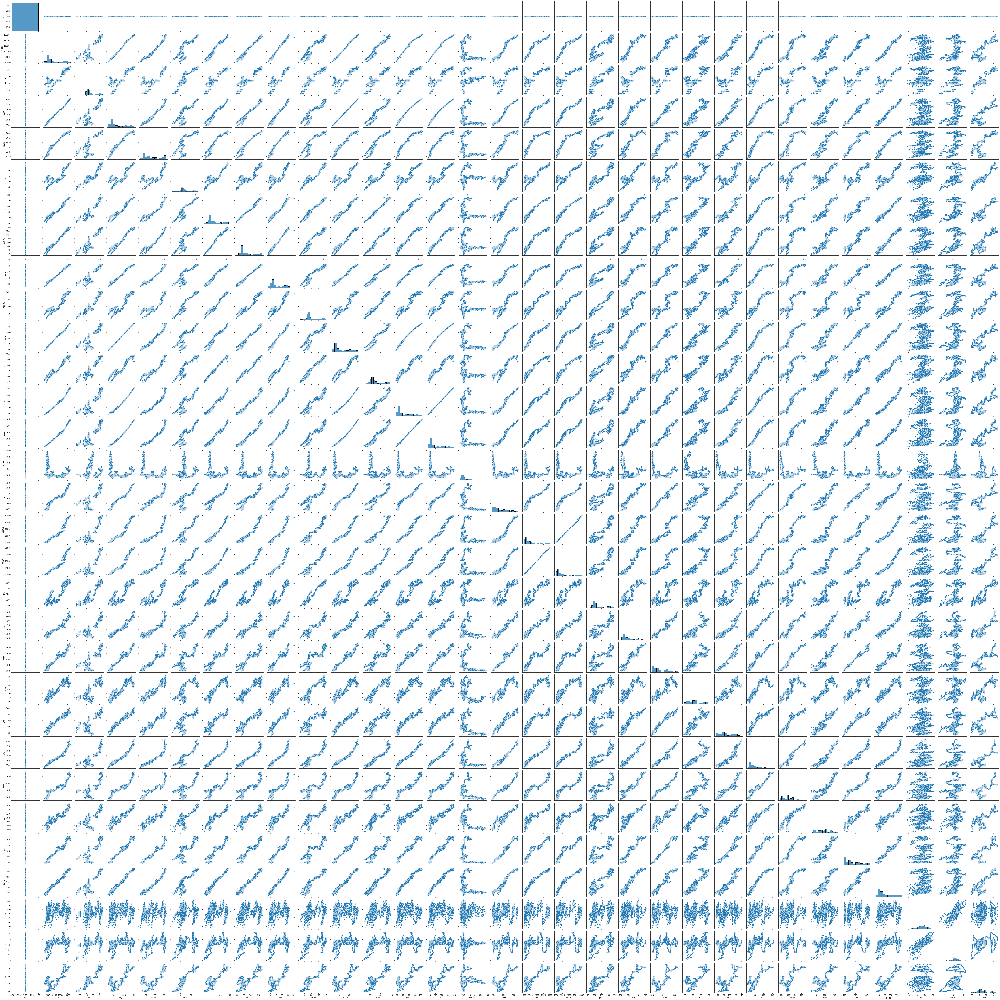

In [130]:
col_names = ["Adj Close"] + pairplot_list
data_for_test = stock_df[col_names]
sns.pairplot(statistic(data_for_test, pairplot_list)[3])


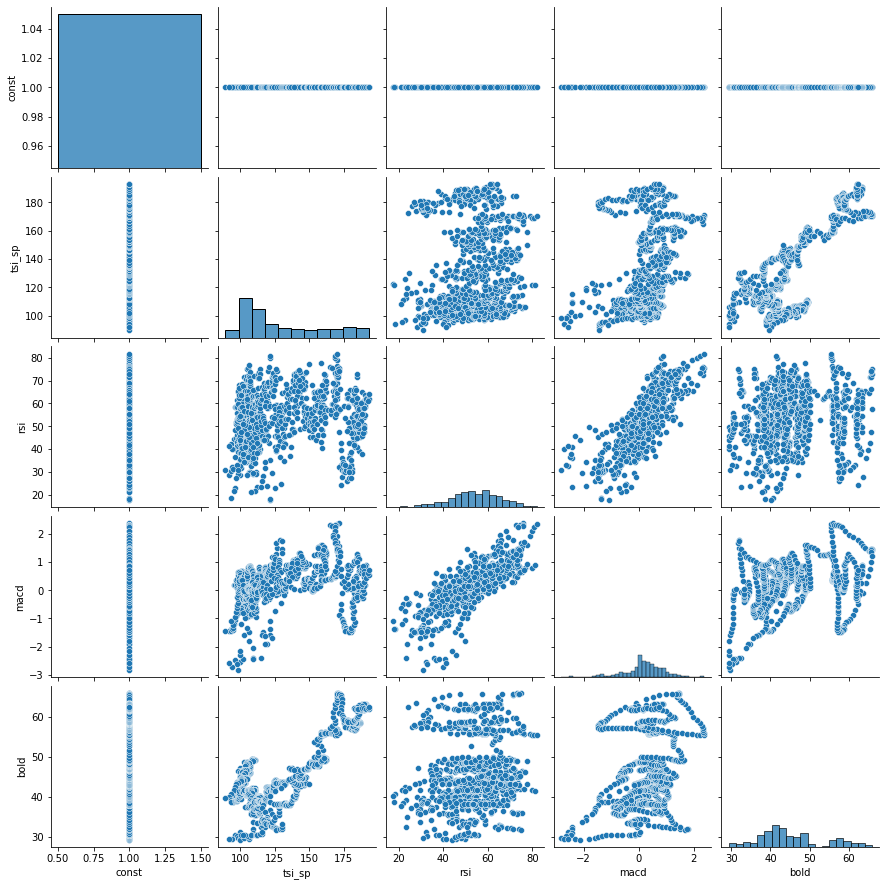

In [133]:
col_names = ["Adj Close"] + ['tsi_sp','rsi','macd','bold']
data_for_test = stock_df[col_names]
sns.pairplot(statistic(data_for_test, ['tsi_sp','rsi','macd','bold'])[3])

In [33]:
# ARIMA as feature
# series = stock_df["Adj Close"]
# model = sm.tsa.arima.ARIMA(series, order=(5, 1, 0))
# model_fit = model.fit()
# print(model_fit.summary())

In [65]:
print('Total dataset has {} samples, and {} features.'.format(stock_df.shape[0], \
                                                              stock_df.shape[1]))

Total dataset has 982 samples, and 103 features.


In [103]:
def get_feature_importance_data(df):
    data = df.copy()
    y = data['Adj Close']
    data = data.drop('Adj Close', axis=1)
    X = data.iloc[:, 1:]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

In [104]:
# data = stock_df.copy()
# data.iloc[:, :]

In [105]:
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(stock_df)

In [107]:
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=150,base_score=0.7,colsample_bytree=1,learning_rate=0.05)

In [108]:
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)

In [109]:
eval_result = regressor.evals_result()

In [110]:
training_rounds = range(len(eval_result['validation_0']['rmse']))

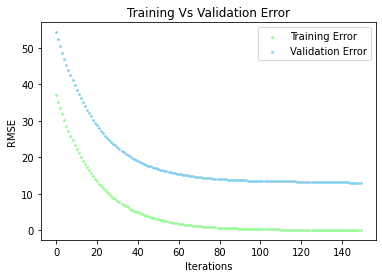

In [166]:
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error', color = "palegreen", s=3)
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error', color = "skyblue", s=3)
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('Training Vs Validation Error')
plt.legend()
plt.show()

In [265]:
# lst = xgbModel.feature_importances_.tolist()
# [lst[i] for i in range(0,len(lst)) if lst[i] >= 0.005]


Text(0.5, 1.0, 'Top 30 features important')

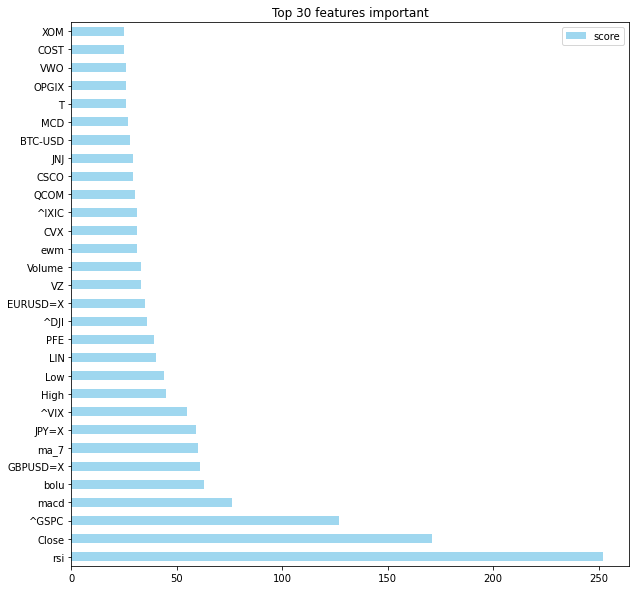

In [183]:
# https://matplotlib.org/stable/gallery/color/named_colors.html
feature_important = xgbModel.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.nlargest(30, columns="score").plot(kind='barh', figsize = (10,10), color = 'skyblue', alpha = 0.8)
plt.title("Top 30 features important")
## plot top 30 features 

In [288]:
data.nlargest(30, columns="score")

,score
rsi,252.0
Close,171.0
^GSPC,127.0
macd,76.0
bolu,63.0
GBPUSD=X,61.0
ma_7,60.0
JPY=X,59.0
^VIX,55.0
High,45.0


In [229]:
pca_df = stock_df.drop('Adj Close', axis=1)
pca_df = stock_df.drop('Date', axis=1)
pca_df

,^GSPC,^DJI,^IXIC,^NYA,^VIX,EURUSD=X,JPY=X,GBPUSD=X,^IRX,^FVX,...,Close,Volume,Adj Close,ewm,ma_7,ma_21,rsi,macd,bolu,bold
0,2581.000000,23860.46094,6777.160156,12270.65039,33.459999,1.226813,109.195999,1.387925,1.515,2.568,...,41.349998,4495200.0,36.631897,36.938362,37.078644,37.011569,44.562755,0.279093,43.851404,39.898263
1,2619.550049,24190.90039,6874.490234,12405.82031,29.059999,1.226076,108.528999,1.393495,1.525,2.516,...,41.490002,5540600.0,36.755924,36.921776,36.893870,37.078222,45.624283,0.230660,43.801392,40.036608
2,2656.000000,24601.26953,6981.959961,12560.12012,25.610001,1.225280,108.800003,1.382743,1.535,2.555,...,41.270000,6433500.0,36.561028,36.888981,36.743267,37.108174,44.192266,0.174539,43.752762,40.151238
3,2662.939941,24640.44922,7013.509766,12574.37012,24.969999,1.230376,108.690002,1.385233,1.570,2.549,...,41.340000,2449900.0,36.623043,36.864805,36.731877,37.143610,44.786122,0.133527,43.724205,40.228462
4,2698.629883,24893.49023,7143.620117,12746.71973,19.260000,1.235376,107.764000,1.388696,1.550,2.640,...,41.820000,3644400.0,37.048271,36.881484,36.886277,37.187483,48.808567,0.133795,43.679449,40.353552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,4791.189941,36302.37891,15871.259770,17141.08984,17.680000,1.159152,113.253998,1.356451,0.043,1.252,...,66.070000,1175900.0,66.070000,64.719121,65.231429,64.166191,58.105626,0.302337,66.388560,62.033441
978,4786.350098,36398.21094,15781.719730,17134.16016,17.540001,1.159555,112.912003,1.356000,0.050,1.245,...,66.930000,1049900.0,66.930000,64.920110,65.340001,64.286667,61.772180,0.438992,66.711888,61.891113
979,4793.060059,36488.62891,15766.219730,17149.92969,16.950001,1.148594,113.904999,1.341274,0.045,1.294,...,67.010002,1038500.0,67.010002,65.110100,65.588573,64.391429,62.104439,0.547438,67.116617,61.917051
980,4778.729980,36398.07813,15741.559570,17164.24023,17.330000,1.145082,114.042999,1.336648,0.025,1.274,...,66.860001,906900.0,66.860001,65.269182,65.965716,64.612857,61.033303,0.614197,67.396706,62.084962


In [244]:
pca = PCA(n_components=.95)

In [245]:
x_pca = StandardScaler().fit_transform(pca_df)

In [246]:
principalComponents = pca.fit_transform(x_pca)

In [249]:
pca.explained_variance_ratio_

array([0.73307572, 0.11095781, 0.0434273 , 0.02876621, 0.01593332,
       0.0147807 , 0.00884808])

In [269]:
n_pcs= pca.components_.shape[0]
initial_feature_names = pca_df.columns
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
most_important_names

['^GSPC', 'WFC', 'MRK', 'macd', 'rsi', 'BTC-USD', 'Volume']

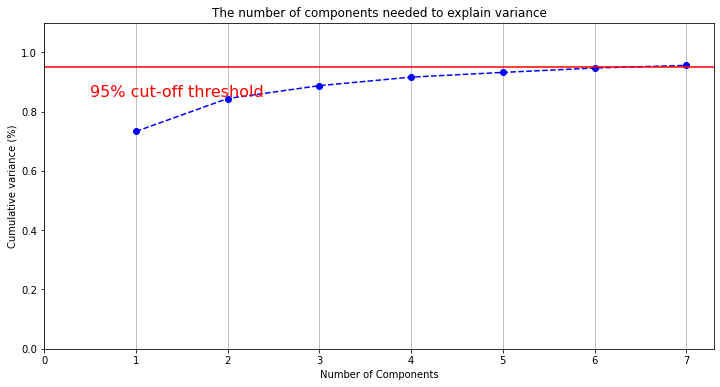

In [286]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 8, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 8, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
# feature_importance_data XGB.Prepare 3 datasets for RNN and LSTM.

In [283]:
dataset_small = stock_df[["Date","Adj Close" ] + most_important_names]
dataset_small.to_csv(r'data\dataset_small_4.csv', index = False, header=True)
dataset_small

,Date,Adj Close,^GSPC,WFC,MRK,macd,rsi,BTC-USD,Volume
0,2018-02-08,36.631897,2581.000000,49.373486,46.133179,0.279093,44.562755,8265.589844,4495200.0
1,2018-02-09,36.755924,2619.550049,50.024082,46.251186,0.230660,45.624283,8736.980469,5540600.0
2,2018-02-12,36.561028,2656.000000,50.353825,46.723221,0.174539,44.192266,8621.900391,6433500.0
3,2018-02-13,36.623043,2662.939941,51.690651,46.276478,0.133527,44.786122,8129.970215,2449900.0
4,2018-02-14,37.048271,2698.629883,53.072037,46.276478,0.133795,48.808567,8926.570313,3644400.0
...,...,...,...,...,...,...,...,...,...
977,2021-12-27,66.070000,4791.189941,48.770000,76.570000,0.302337,58.105626,11555.363280,1175900.0
978,2021-12-28,66.930000,4786.350098,48.419998,76.809998,0.438992,61.772180,11425.899410,1049900.0
979,2021-12-29,67.010002,4793.060059,48.450001,76.949997,0.547438,62.104439,11429.506840,1038500.0
980,2021-12-30,66.860001,4778.729980,48.099998,77.139999,0.614197,61.033303,11495.349610,906900.0


In [284]:
dataset_big = stock_df[["Date","Adj Close" ] + list(data.nlargest(30, columns="score").index)]
dataset_big.to_csv(r'data\dataset_big_4.csv', index = False, header=True)
dataset_big

,Date,Adj Close,rsi,Close,^GSPC,macd,bolu,GBPUSD=X,ma_7,JPY=X,...,QCOM,CSCO,JNJ,BTC-USD,MCD,T,OPGIX,VWO,COST,XOM
0,2018-02-08,36.631897,44.562755,41.349998,2581.000000,0.279093,43.851404,1.387925,37.078644,109.195999,...,55.436909,34.422523,113.620201,8265.589844,144.398575,27.331118,51.751373,40.350636,167.851227,60.810085
1,2018-02-09,36.755924,45.624283,41.490002,2619.550049,0.230660,43.801392,1.393495,36.893870,108.528999,...,56.831268,35.097298,116.470573,8736.980469,146.060852,27.699932,51.907001,40.960930,169.834152,61.197720
2,2018-02-12,36.561028,44.192266,41.270000,2656.000000,0.174539,43.752762,1.382743,36.743267,108.800003,...,58.314449,36.047317,117.135971,8621.900391,148.876709,27.945822,52.840797,41.526337,170.153610,61.714565
3,2018-02-13,36.623043,44.786122,41.340000,2662.939941,0.133527,43.724205,1.385233,36.731877,108.690002,...,58.349968,36.606670,116.857239,8129.970215,147.514191,28.122543,52.863033,41.849430,173.057541,61.617657
4,2018-02-14,37.048271,48.808567,41.820000,2698.629883,0.133795,43.679449,1.388696,36.886277,107.764000,...,59.140404,37.370235,116.596481,8926.570313,145.325119,27.976555,54.545338,42.711006,176.064758,61.746876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,66.070000,58.105626,66.070000,4791.189941,0.302337,66.388560,1.356451,65.231429,113.253998,...,186.330002,63.048477,169.669998,11555.363280,268.239990,24.286488,75.089996,49.340000,563.469971,61.889999
978,2021-12-28,66.930000,61.772180,66.930000,4786.350098,0.438992,66.711888,1.356000,65.340001,112.912003,...,184.820007,63.157833,170.350006,11425.899410,267.880005,24.325691,74.750000,49.169998,564.640015,61.689999
979,2021-12-29,67.010002,62.104439,67.010002,4793.060059,0.547438,67.116617,1.341274,65.588573,113.904999,...,186.199997,63.585312,171.550003,11429.506840,268.489990,24.149275,74.500000,48.959999,567.770019,61.150002
980,2021-12-30,66.860001,61.033303,66.860001,4778.729980,0.614197,67.396706,1.336648,65.965716,114.042999,...,182.729996,63.247307,172.309998,11495.349610,267.209992,24.286488,74.379997,49.590000,563.909973,60.790001


In [290]:
# Breusch-Pagan LM test P-Value:  >=0.5

dataset_breusch_pagan_test = stock_df[["Date","Adj Close" ] + pairplot_list]
dataset_breusch_pagan_test.to_csv(r'data\dataset_breusch_pagan_test_4.csv', index = False, header=True)
dataset_breusch_pagan_test

,Date,Adj Close,^IXIC,DWCR,QQQ,FRQIX,NELIX,JLCYX,OGLYX,IWIRX,...,CMCSA,ABT,ACN,COST,MCD,DHR,tsi_sp,rsi,macd,bold
0,2018-02-08,36.631897,6777.160156,28.866859,149.346725,47.940331,41.945034,40.378651,72.899536,31.677456,...,35.177319,52.763493,141.572220,167.851227,144.398575,90.481277,100.00,44.562755,0.279093,39.898263
1,2018-02-09,36.755924,6874.490234,28.461983,151.925858,48.017483,42.369419,40.871876,73.495110,32.161194,...,35.527340,53.607403,144.704468,169.834152,146.060852,92.739372,99.50,45.624283,0.230660,40.036608
2,2018-02-12,36.561028,6981.959961,29.057840,154.621765,48.231846,42.714848,41.480183,74.539291,32.652264,...,35.499706,53.832443,145.748581,170.153610,148.876709,93.672089,95.77,44.192266,0.174539,40.151238
3,2018-02-13,36.623043,7013.509766,29.057840,155.419876,48.274735,43.020802,41.521290,74.539291,32.696236,...,35.886578,54.048111,147.526321,173.057541,147.514191,93.249924,97.19,44.786122,0.133527,40.228462
4,2018-02-14,37.048271,7143.620117,29.585907,158.329895,48.463356,43.504406,42.400875,75.838730,33.421841,...,36.319500,54.648228,150.301148,176.064758,145.325119,94.349518,98.46,48.808567,0.133795,40.353552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,2021-12-27,66.070000,15871.259770,36.707001,403.480011,60.580002,55.820000,75.349998,126.059998,62.680000,...,50.221329,140.962799,414.255981,563.469971,268.239990,327.197418,189.80,58.105626,0.302337,62.033441
978,2021-12-28,66.930000,15781.719730,36.955002,401.609985,60.570000,55.759998,75.320000,125.599998,62.430000,...,50.261131,139.976273,414.196137,564.640015,267.880005,323.230011,190.72,61.772180,0.438992,61.891113
979,2021-12-29,67.010002,15766.219730,36.955002,401.549988,60.470001,55.880001,75.330002,125.349998,62.450001,...,50.340736,140.693741,414.345795,567.770019,268.489990,326.579987,192.89,62.104439,0.547438,61.917051
980,2021-12-30,66.860001,15741.559570,36.955002,400.350006,59.180000,55.610001,75.220001,125.529999,62.230000,...,50.340736,140.504410,412.759857,563.909973,267.209992,328.470001,192.77,61.033303,0.614197,62.084962
